# Import libraries and variables

In [64]:
# !pip install gymnasium[atari, accept-rom-license] stable-baselines3
# !pip install sb3-contrib 
import matplotlib.pyplot as plt

import gymnasium as gym
from stable_baselines3.common.env_util import make_atari_env
from stable_baselines3.common.vec_env import VecFrameStack
from stable_baselines3.common.evaluation import evaluate_policy
from stable_baselines3.common.callbacks import EvalCallback, CheckpointCallback

import ale_py
gym.register_envs(ale_py)

import time
import numpy as np
from stable_baselines3 import DQN,PPO
from sb3_contrib.qrdqn import QRDQN

# Para selección de hiperparámetros 
import optuna    
import torch

import pickle, os, random, collections, tqdm, math

c:\Users\Usuario\miniconda3\envs\rf_lab\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [65]:
ENV_ID = "MsPacmanNoFrameskip-v4"
N_ENVS = 1
SEED = 42
N_EPISODES = 100

# QR‑DQN (Quantile regresion)

In [ ]:
train_env = make_atari_env(ENV_ID, seed=SEED, n_envs=N_ENVS)
train_env = VecFrameStack(train_env, n_stack=4)

eval_env = make_atari_env(ENV_ID, seed=123, n_envs=N_ENVS)
eval_env = VecFrameStack(eval_env, n_stack=4)

eval_cb = EvalCallback(eval_env, best_model_save_path="../models/qrdqn",
                       eval_freq=100_000, n_eval_episodes=10,
                       deterministic=True, render=False)

ckpt_cb = CheckpointCallback(save_freq=1_000_000, save_path="../models/qrdqn/checkpoints",
                             name_prefix="qrdqn_pacman")

In [ ]:
policy_kwargs = dict(
    n_quantiles=200,
    normalize_images=False
)

model = QRDQN(
    "CnnPolicy",
    train_env,
    learning_rate=lambda f: 2.5e-5 * (1 - f),
    buffer_size=200_000,
    learning_starts=80_000,
    batch_size=32,
    gamma=0.99,
    train_freq=4,
    gradient_steps=1,
    target_update_interval=4_000,
    exploration_fraction=0.12,
    exploration_initial_eps=1.0,
    exploration_final_eps=0.01,
    policy_kwargs=policy_kwargs,
    verbose=1,
    device="auto",
)

Using cuda device
Wrapping the env in a VecTransposeImage.


c:\Users\Usuario\miniconda3\envs\rf_lab\Lib\site-packages\stable_baselines3\common\buffers.py:242: UserWarning: This system does not have apparently enough memory to store the complete replay buffer 11.29GB > 8.50GB
  warnings.warn(


In [ ]:
total_timesteps = 5_000_000
model.learn(total_timesteps=total_timesteps, callback=[eval_cb, ckpt_cb])
model.save("../models/qrdqn/best_model_final.zip")
train_env.close()

c:\Users\Usuario\miniconda3\envs\rf_lab\Lib\site-packages\stable_baselines3\common\callbacks.py:418: UserWarning: Training and eval env are not of the same type<stable_baselines3.common.vec_env.vec_transpose.VecTransposeImage object at 0x000001CA910549E0> != <stable_baselines3.common.vec_env.vec_frame_stack.VecFrameStack object at 0x000001CA9A342870>
  warnings.warn("Training and eval env are not of the same type" f"{self.training_env} != {self.eval_env}")


----------------------------------
| rollout/            |          |
|    ep_len_mean      | 1.85e+03 |
|    ep_rew_mean      | 190      |
|    exploration_rate | 0.999    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 701      |
|    time_elapsed     | 0        |
|    total_timesteps  | 642      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 2.19e+03 |
|    ep_rew_mean      | 275      |
|    exploration_rate | 0.998    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 758      |
|    time_elapsed     | 1        |
|    total_timesteps  | 1378     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 2.14e+03 |
|    ep_rew_mean      | 275      |
|    exploration_rate | 0.997    |
| time/               |          |
|    episodes       

## Medir performance del modelo con evaluate policy

In [76]:
model = QRDQN.load("../models/qrdqn/best_model_final.zip")
mean, std = evaluate_policy(model, eval_env, n_eval_episodes=10)
print(f"Return medio: {mean:.0f} ± {std:.0f}")

c:\Users\Usuario\miniconda3\envs\rf_lab\Lib\site-packages\stable_baselines3\common\buffers.py:242: UserWarning: This system does not have apparently enough memory to store the complete replay buffer 11.29GB > 10.95GB
  warnings.warn(


Return medio: 1541 ± 311


## ver ejecuccion

### Buscar mejor el mejor modelo en N episodios

In [77]:
best_return   = -np.inf
best_actions  = []
best_seed     = None
returns       = []

for ep in range(N_EPISODES):
    eval_env.seed(SEED + ep)
    obs = eval_env.reset()
    done = False
    ep_return = 0.0
    actions   = []

    while not done:
        action, _ = model.predict(obs, deterministic=True)
        obs, reward, done, _ = eval_env.step(action)
        actions.append(int(action))
        ep_return += float(reward[0])

    returns.append(ep_return)
    print(f"Episodio={ep} con reward={ep_return}")
    
    if ep_return > best_return:
        best_return  = ep_return
        best_actions = actions
        best_seed    = SEED + ep
        

print(f"\nMejor retorno encontrado: {best_return:.0f} (episodio seed={best_seed})")
eval_env.close()

C:\Users\Usuario\AppData\Local\Temp\ipykernel_10376\3086084644.py:16: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  actions.append(int(action))


Episodio=0 con reward=68.0
Episodio=1 con reward=19.0
Episodio=2 con reward=3.0
Episodio=3 con reward=68.0
Episodio=4 con reward=19.0
Episodio=5 con reward=3.0
Episodio=6 con reward=32.0
Episodio=7 con reward=21.0
Episodio=8 con reward=50.0
Episodio=9 con reward=104.0
Episodio=10 con reward=21.0
Episodio=11 con reward=1.0
Episodio=12 con reward=32.0
Episodio=13 con reward=21.0
Episodio=14 con reward=50.0
Episodio=15 con reward=104.0
Episodio=16 con reward=21.0
Episodio=17 con reward=1.0
Episodio=18 con reward=100.0
Episodio=19 con reward=15.0
Episodio=20 con reward=0.0
Episodio=21 con reward=100.0
Episodio=22 con reward=15.0
Episodio=23 con reward=0.0
Episodio=24 con reward=100.0
Episodio=25 con reward=15.0
Episodio=26 con reward=0.0
Episodio=27 con reward=68.0
Episodio=28 con reward=19.0
Episodio=29 con reward=3.0
Episodio=30 con reward=32.0
Episodio=31 con reward=21.0
Episodio=32 con reward=50.0
Episodio=33 con reward=104.0
Episodio=34 con reward=21.0
Episodio=35 con reward=1.0
Episo

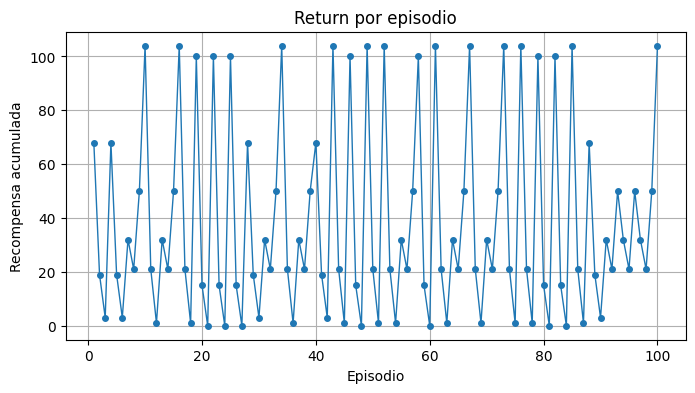

In [78]:
plt.figure(figsize=(8,4))
plt.plot(  range(1, len(returns) + 1),  returns, marker="o", linestyle="-",linewidth=1, markersize=4)
plt.title("Return por episodio")
plt.xlabel("Episodio")
plt.ylabel("Recompensa acumulada")
plt.grid(True)
plt.show()

### Visualizar el mejor modelo

In [ ]:
play_env = make_atari_env(ENV_ID, n_envs=1,seed=best_seed, env_kwargs={"render_mode": "human"})
play_env = VecFrameStack(play_env, n_stack=4)

obs = play_env.reset()
done = False
total_reward = 0.0
while not done:
    action, _ = model.predict(obs, deterministic=True)
    obs, reward, done, _ = play_env.step(action)
    total_reward += float(reward[0])
    play_env.render()
    time.sleep(0.02)

print("Episodio terminado, recompensa acumulada:", total_reward)
play_env.close()

Episodio terminado, recompensa acumulada: 104.0


# Deep Q-Network (DQN)

In [ ]:
train_env = make_atari_env(ENV_ID, seed=SEED, n_envs=N_ENVS)
train_env = VecFrameStack(train_env, n_stack=4)

eval_env = make_atari_env(ENV_ID, seed=123, n_envs=N_ENVS)
eval_env = VecFrameStack(eval_env, n_stack=4)

eval_cb = EvalCallback(eval_env, best_model_save_path="../models/dqn",
                       eval_freq=100_000, n_eval_episodes=10,
                       deterministic=True, render=False)

ckpt_cb = CheckpointCallback(save_freq=1_000_000, save_path="../models/dqn/checkpoints",
                             name_prefix="dqn_pacman")

In [ ]:
model = DQN(
    policy="CnnPolicy",
    env=train_env,
    learning_rate=lambda f: 2.5e-4 * (1 - f),
    buffer_size=200_000,
    learning_starts=80_000,
    batch_size=32,
    tau=1.0,
    gamma=0.99,
    train_freq=4,
    target_update_interval=4_000,
    exploration_fraction=0.12,
    exploration_final_eps=0.01,
    exploration_initial_eps=1.0,
    verbose=1)

Using cuda device
Wrapping the env in a VecTransposeImage.


c:\Users\Usuario\miniconda3\envs\rf_lab\Lib\site-packages\stable_baselines3\common\buffers.py:242: UserWarning: This system does not have apparently enough memory to store the complete replay buffer 11.29GB > 9.89GB
  warnings.warn(


In [ ]:
total_timesteps = 5_000_000
model.learn(total_timesteps=total_timesteps, callback=[eval_cb, ckpt_cb])
model.save("../models/dqn/best_model_final.zip")
train_env.close()

c:\Users\Usuario\miniconda3\envs\rf_lab\Lib\site-packages\stable_baselines3\common\callbacks.py:418: UserWarning: Training and eval env are not of the same type<stable_baselines3.common.vec_env.vec_transpose.VecTransposeImage object at 0x0000012148FBBAD0> != <stable_baselines3.common.vec_env.vec_frame_stack.VecFrameStack object at 0x0000011FE2ED83B0>
  warnings.warn("Training and eval env are not of the same type" f"{self.training_env} != {self.eval_env}")


----------------------------------
| rollout/            |          |
|    ep_len_mean      | 1.85e+03 |
|    ep_rew_mean      | 190      |
|    exploration_rate | 0.999    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 907      |
|    time_elapsed     | 0        |
|    total_timesteps  | 642      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 2.19e+03 |
|    ep_rew_mean      | 275      |
|    exploration_rate | 0.998    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 966      |
|    time_elapsed     | 1        |
|    total_timesteps  | 1378     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 2.14e+03 |
|    ep_rew_mean      | 275      |
|    exploration_rate | 0.997    |
| time/               |          |
|    episodes       

## Medir performance del modelo con evaluate policy

In [73]:
model = DQN.load("../models/dqn/best_model_final.zip")
mean, std = evaluate_policy(model, eval_env, n_eval_episodes=10)
print(f"Return medio: {mean:.0f} ± {std:.0f}")

c:\Users\Usuario\miniconda3\envs\rf_lab\Lib\site-packages\stable_baselines3\common\buffers.py:242: UserWarning: This system does not have apparently enough memory to store the complete replay buffer 11.29GB > 7.36GB
  warnings.warn(


Return medio: 1226 ± 954


## ver ejecuccion

### Buscar mejor el mejor modelo en N episodios

In [74]:
best_return   = -np.inf
best_actions  = []
best_seed     = None
returns       = []

for ep in range(N_EPISODES):
    eval_env.seed(SEED + ep)
    obs = eval_env.reset()
    done = False
    ep_return = 0.0
    actions   = []

    while not done:
        action, _ = model.predict(obs, deterministic=True)
        obs, reward, done, _ = eval_env.step(action)
        actions.append(int(action))
        ep_return += float(reward[0])

    returns.append(ep_return)
    print(f"Episodio={ep} con reward={ep_return}")
    
    if ep_return > best_return:
        best_return  = ep_return
        best_actions = actions
        best_seed    = SEED + ep
        

print(f"\nMejor retorno encontrado: {best_return:.0f} (episodio seed={best_seed})")
eval_env.close()

C:\Users\Usuario\AppData\Local\Temp\ipykernel_10376\3086084644.py:16: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  actions.append(int(action))


Episodio=0 con reward=122.0
Episodio=1 con reward=7.0
Episodio=2 con reward=9.0
Episodio=3 con reward=122.0
Episodio=4 con reward=7.0
Episodio=5 con reward=9.0
Episodio=6 con reward=18.0
Episodio=7 con reward=12.0
Episodio=8 con reward=1.0
Episodio=9 con reward=133.0
Episodio=10 con reward=6.0
Episodio=11 con reward=4.0
Episodio=12 con reward=18.0
Episodio=13 con reward=12.0
Episodio=14 con reward=1.0
Episodio=15 con reward=133.0
Episodio=16 con reward=6.0
Episodio=17 con reward=4.0
Episodio=18 con reward=127.0
Episodio=19 con reward=6.0
Episodio=20 con reward=0.0
Episodio=21 con reward=127.0
Episodio=22 con reward=6.0
Episodio=23 con reward=0.0
Episodio=24 con reward=127.0
Episodio=25 con reward=6.0
Episodio=26 con reward=0.0
Episodio=27 con reward=122.0
Episodio=28 con reward=7.0
Episodio=29 con reward=9.0
Episodio=30 con reward=18.0
Episodio=31 con reward=12.0
Episodio=32 con reward=1.0
Episodio=33 con reward=133.0
Episodio=34 con reward=6.0
Episodio=35 con reward=4.0
Episodio=36 co

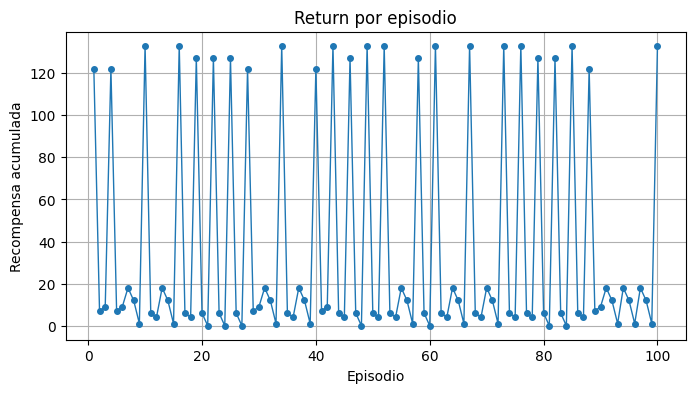

In [75]:
plt.figure(figsize=(8,4))
plt.plot(  range(1, len(returns) + 1),  returns, marker="o", linestyle="-",linewidth=1, markersize=4)
plt.title("Return por episodio")
plt.xlabel("Episodio")
plt.ylabel("Recompensa acumulada")
plt.grid(True)
plt.show()

### Visualizar el mejor modelo

In [ ]:
play_env = make_atari_env(ENV_ID, n_envs=1,seed=best_seed, env_kwargs={"render_mode": "human"})
play_env = VecFrameStack(play_env, n_stack=4)

obs = play_env.reset()
done = False
total_reward = 0.0
while not done:
    action, _ = model.predict(obs, deterministic=True)
    obs, reward, done, _ = play_env.step(action)
    total_reward += float(reward[0])
    play_env.render()
    time.sleep(0.02)

print("Episodio terminado, recompensa acumulada:", total_reward)
play_env.close()

Episodio terminado, recompensa acumulada: 133.0


# DQN with optuna (hyperparameter tunning)

In [68]:
train_env = make_atari_env(ENV_ID, seed=SEED, n_envs=N_ENVS)
train_env = VecFrameStack(train_env, n_stack=4)

eval_env = make_atari_env(ENV_ID, seed=123, n_envs=N_ENVS)
eval_env = VecFrameStack(eval_env, n_stack=4)

In [ ]:
TOTAL_FRAMES_TUNE = 100_000

def objective(trial: optuna.Trial) -> float:
    print("cuda" if torch.cuda.is_available() else "cpu")
    lr        = trial.suggest_loguniform("learning_rate", 5e-4, 5e-3)
    buff_size = trial.suggest_categorical("buffer_size", [100_000])
    batch_sz  = trial.suggest_categorical("batch_size", [32, 64])
    tau       = trial.suggest_uniform("tau", 0.8, 1.0)
    gamma     = trial.suggest_uniform("gamma", 0.97, 0.999)
    train_fr  = trial.suggest_categorical("train_freq", [2, 4, 8])
    expl_frac = trial.suggest_uniform("exploration_fraction", 0.05, 0.2)

    model = DQN(
        "CnnPolicy", 
        train_env,
        learning_rate        = lr,
        buffer_size          = buff_size,
        batch_size           = batch_sz,
        tau                  = tau,
        gamma                = gamma,
        train_freq           = (train_fr, "step"),
        target_update_interval = 10_000,
        exploration_fraction = expl_frac,
        exploration_initial_eps = 1.0,
        exploration_final_eps   = 0.05,
        learning_starts      = 50_000,
        verbose              = 0,
        seed                 = SEED,
        device               = "cuda" if torch.cuda.is_available() else "cpu"
    )

    model.learn(TOTAL_FRAMES_TUNE, progress_bar=False)
    mean_reward, _ = evaluate_policy(model, eval_env, n_eval_episodes=10, deterministic=True)
    train_env.close()
    return mean_reward

In [69]:
study = optuna.create_study(
            direction="maximize",
            sampler=optuna.samplers.TPESampler(seed=SEED),
            pruner = optuna.pruners.MedianPruner(n_warmup_steps=25))

study.optimize(objective, n_trials=20, n_jobs=1)

print("Best reward:", study.best_value)
print("Best params:", study.best_params)

[I 2025-04-19 23:59:48,224] A new study created in memory with name: no-name-dfbf625b-2f4a-4200-aa71-2d7756122bb1
C:\Users\Usuario\AppData\Local\Temp\ipykernel_10376\2529841973.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr        = trial.suggest_loguniform("learning_rate", 5e-4, 5e-3)
C:\Users\Usuario\AppData\Local\Temp\ipykernel_10376\2529841973.py:9: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  tau       = trial.suggest_uniform("tau", 0.8, 1.0)
C:\Users\Usuario\AppData\Local\Temp\ipykernel_10376\2529841973.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use s

cuda


[I 2025-04-20 00:02:57,475] Trial 0 finished with value: 90.0 and parameters: {'learning_rate': 0.0011844319751820387, 'buffer_size': 100000, 'batch_size': 32, 'tau': 0.9197316968394074, 'gamma': 0.9745245405728307, 'train_freq': 8, 'exploration_fraction': 0.14016725176148134}. Best is trial 0 with value: 90.0.
c:\Users\Usuario\miniconda3\envs\rf_lab\Lib\site-packages\stable_baselines3\common\buffers.py:242: UserWarning: This system does not have apparently enough memory to store the complete replay buffer 5.65GB > 2.48GB
  warnings.warn(


cuda


[I 2025-04-20 00:06:34,483] Trial 1 finished with value: 210.0 and parameters: {'learning_rate': 0.002552951604697378, 'buffer_size': 100000, 'batch_size': 64, 'tau': 0.9664885281600843, 'gamma': 0.97615783420967, 'train_freq': 8, 'exploration_fraction': 0.1287134647448357}. Best is trial 1 with value: 210.0.


cuda


c:\Users\Usuario\miniconda3\envs\rf_lab\Lib\site-packages\stable_baselines3\common\buffers.py:242: UserWarning: This system does not have apparently enough memory to store the complete replay buffer 5.65GB > 4.81GB
  warnings.warn(
[I 2025-04-20 00:09:55,696] Trial 2 finished with value: 210.0 and parameters: {'learning_rate': 0.0013518080333310004, 'buffer_size': 100000, 'batch_size': 64, 'tau': 0.8278987721304084, 'gamma': 0.9784721948075213, 'train_freq': 8, 'exploration_fraction': 0.07995106732375397}. Best is trial 1 with value: 210.0.
c:\Users\Usuario\miniconda3\envs\rf_lab\Lib\site-packages\stable_baselines3\common\buffers.py:242: UserWarning: This system does not have apparently enough memory to store the complete replay buffer 5.65GB > 3.75GB
  warnings.warn(


cuda


[I 2025-04-20 00:13:19,063] Trial 3 finished with value: 70.0 and parameters: {'learning_rate': 0.0016338208828908817, 'buffer_size': 100000, 'batch_size': 32, 'tau': 0.9215089703802877, 'gamma': 0.9749451995869314, 'train_freq': 8, 'exploration_fraction': 0.1712596022174692}. Best is trial 1 with value: 210.0.


cuda


c:\Users\Usuario\miniconda3\envs\rf_lab\Lib\site-packages\stable_baselines3\common\buffers.py:242: UserWarning: This system does not have apparently enough memory to store the complete replay buffer 5.65GB > 2.26GB
  warnings.warn(
[I 2025-04-20 00:16:39,350] Trial 4 finished with value: 415.0 and parameters: {'learning_rate': 0.0010082860845904299, 'buffer_size': 100000, 'batch_size': 64, 'tau': 0.8880304987479203, 'gamma': 0.9735391088104985, 'train_freq': 8, 'exploration_fraction': 0.08881699724000255}. Best is trial 4 with value: 415.0.
c:\Users\Usuario\miniconda3\envs\rf_lab\Lib\site-packages\stable_baselines3\common\buffers.py:242: UserWarning: This system does not have apparently enough memory to store the complete replay buffer 5.65GB > 2.50GB
  warnings.warn(


cuda


[I 2025-04-20 00:22:17,220] Trial 5 finished with value: 210.0 and parameters: {'learning_rate': 0.002298752892366083, 'buffer_size': 100000, 'batch_size': 64, 'tau': 0.9093420558686559, 'gamma': 0.9753607792102402, 'train_freq': 2, 'exploration_fraction': 0.18422410256414734}. Best is trial 4 with value: 415.0.
c:\Users\Usuario\miniconda3\envs\rf_lab\Lib\site-packages\stable_baselines3\common\buffers.py:242: UserWarning: This system does not have apparently enough memory to store the complete replay buffer 5.65GB > 2.96GB
  warnings.warn(


cuda


[I 2025-04-20 00:26:20,715] Trial 6 finished with value: 210.0 and parameters: {'learning_rate': 0.001980933895203292, 'buffer_size': 100000, 'batch_size': 32, 'tau': 0.8391965724838291, 'gamma': 0.9713115913784056, 'train_freq': 4, 'exploration_fraction': 0.17431062637278943}. Best is trial 4 with value: 415.0.
c:\Users\Usuario\miniconda3\envs\rf_lab\Lib\site-packages\stable_baselines3\common\buffers.py:242: UserWarning: This system does not have apparently enough memory to store the complete replay buffer 5.65GB > 3.39GB
  warnings.warn(


cuda


[I 2025-04-20 00:30:50,260] Trial 7 finished with value: 557.0 and parameters: {'learning_rate': 0.0011369027867815917, 'buffer_size': 100000, 'batch_size': 64, 'tau': 0.8281848449949526, 'gamma': 0.9932637124418672, 'train_freq': 4, 'exploration_fraction': 0.07980735223012586}. Best is trial 7 with value: 557.0.
c:\Users\Usuario\miniconda3\envs\rf_lab\Lib\site-packages\stable_baselines3\common\buffers.py:242: UserWarning: This system does not have apparently enough memory to store the complete replay buffer 5.65GB > 3.20GB
  warnings.warn(


cuda


[I 2025-04-20 00:35:00,133] Trial 8 finished with value: 887.0 and parameters: {'learning_rate': 0.0005063981628665742, 'buffer_size': 100000, 'batch_size': 32, 'tau': 0.9458014336081975, 'gamma': 0.9923668400538924, 'train_freq': 4, 'exploration_fraction': 0.17946551388133902}. Best is trial 8 with value: 887.0.
c:\Users\Usuario\miniconda3\envs\rf_lab\Lib\site-packages\stable_baselines3\common\buffers.py:242: UserWarning: This system does not have apparently enough memory to store the complete replay buffer 5.65GB > 4.18GB
  warnings.warn(


cuda


[I 2025-04-20 00:38:35,438] Trial 9 finished with value: 60.0 and parameters: {'learning_rate': 0.002100236158351101, 'buffer_size': 100000, 'batch_size': 32, 'tau': 0.8621964643431325, 'gamma': 0.9794303163387756, 'train_freq': 8, 'exploration_fraction': 0.1208322387742924}. Best is trial 8 with value: 887.0.


cuda


[I 2025-04-20 00:42:57,648] Trial 10 finished with value: 642.0 and parameters: {'learning_rate': 0.000524239644472643, 'buffer_size': 100000, 'batch_size': 32, 'tau': 0.9939074221575732, 'gamma': 0.9973728462485039, 'train_freq': 4, 'exploration_fraction': 0.15181900758530745}. Best is trial 8 with value: 887.0.
c:\Users\Usuario\miniconda3\envs\rf_lab\Lib\site-packages\stable_baselines3\common\buffers.py:242: UserWarning: This system does not have apparently enough memory to store the complete replay buffer 5.65GB > 4.60GB
  warnings.warn(


cuda


[I 2025-04-20 00:47:14,309] Trial 11 finished with value: 163.0 and parameters: {'learning_rate': 0.0005093930737869956, 'buffer_size': 100000, 'batch_size': 32, 'tau': 0.9911733628371433, 'gamma': 0.9989229035512549, 'train_freq': 4, 'exploration_fraction': 0.15457338475101423}. Best is trial 8 with value: 887.0.
c:\Users\Usuario\miniconda3\envs\rf_lab\Lib\site-packages\stable_baselines3\common\buffers.py:242: UserWarning: This system does not have apparently enough memory to store the complete replay buffer 5.65GB > 4.53GB
  warnings.warn(


cuda


[I 2025-04-20 00:51:15,289] Trial 12 finished with value: 348.0 and parameters: {'learning_rate': 0.0005146419695163265, 'buffer_size': 100000, 'batch_size': 32, 'tau': 0.9603919612121175, 'gamma': 0.9897448436151555, 'train_freq': 4, 'exploration_fraction': 0.19940428969142818}. Best is trial 8 with value: 887.0.
c:\Users\Usuario\miniconda3\envs\rf_lab\Lib\site-packages\stable_baselines3\common\buffers.py:242: UserWarning: This system does not have apparently enough memory to store the complete replay buffer 5.65GB > 4.87GB
  warnings.warn(


cuda


[I 2025-04-20 00:55:22,234] Trial 13 finished with value: 248.0 and parameters: {'learning_rate': 0.0007528128197517139, 'buffer_size': 100000, 'batch_size': 32, 'tau': 0.9912504296258324, 'gamma': 0.9989537175121325, 'train_freq': 4, 'exploration_fraction': 0.15509967082837828}. Best is trial 8 with value: 887.0.
c:\Users\Usuario\miniconda3\envs\rf_lab\Lib\site-packages\stable_baselines3\common\buffers.py:242: UserWarning: This system does not have apparently enough memory to store the complete replay buffer 5.65GB > 4.89GB
  warnings.warn(


cuda


[I 2025-04-20 01:00:41,387] Trial 14 finished with value: 70.0 and parameters: {'learning_rate': 0.003948629158008042, 'buffer_size': 100000, 'batch_size': 32, 'tau': 0.9504439963330322, 'gamma': 0.9906473562641889, 'train_freq': 2, 'exploration_fraction': 0.10787308372742943}. Best is trial 8 with value: 887.0.
c:\Users\Usuario\miniconda3\envs\rf_lab\Lib\site-packages\stable_baselines3\common\buffers.py:242: UserWarning: This system does not have apparently enough memory to store the complete replay buffer 5.65GB > 4.86GB
  warnings.warn(


cuda


[I 2025-04-20 01:04:21,506] Trial 15 finished with value: 143.0 and parameters: {'learning_rate': 0.0007722090711907989, 'buffer_size': 100000, 'batch_size': 32, 'tau': 0.9422499527884228, 'gamma': 0.9846278326069434, 'train_freq': 4, 'exploration_fraction': 0.19937083969865405}. Best is trial 8 with value: 887.0.


cuda


[I 2025-04-20 01:07:58,367] Trial 16 finished with value: 192.0 and parameters: {'learning_rate': 0.0006987343914751182, 'buffer_size': 100000, 'batch_size': 32, 'tau': 0.9989396887586316, 'gamma': 0.9945571909315133, 'train_freq': 4, 'exploration_fraction': 0.055435653217984604}. Best is trial 8 with value: 887.0.


cuda


[I 2025-04-20 01:11:35,132] Trial 17 finished with value: 341.0 and parameters: {'learning_rate': 0.0005906229075301921, 'buffer_size': 100000, 'batch_size': 32, 'tau': 0.9778116092991117, 'gamma': 0.9864105781135081, 'train_freq': 4, 'exploration_fraction': 0.15337882434464534}. Best is trial 8 with value: 887.0.


cuda


[I 2025-04-20 01:16:05,347] Trial 18 finished with value: 210.0 and parameters: {'learning_rate': 0.0009639980112453536, 'buffer_size': 100000, 'batch_size': 32, 'tau': 0.9416756040552992, 'gamma': 0.9951064804530402, 'train_freq': 2, 'exploration_fraction': 0.17509075002550611}. Best is trial 8 with value: 887.0.
c:\Users\Usuario\miniconda3\envs\rf_lab\Lib\site-packages\stable_baselines3\common\buffers.py:242: UserWarning: This system does not have apparently enough memory to store the complete replay buffer 5.65GB > 1.21GB
  warnings.warn(


cuda


[I 2025-04-20 01:19:37,719] Trial 19 finished with value: 434.0 and parameters: {'learning_rate': 0.0008449566418286071, 'buffer_size': 100000, 'batch_size': 32, 'tau': 0.8825864176123123, 'gamma': 0.9881539398199676, 'train_freq': 4, 'exploration_fraction': 0.1403306357241372}. Best is trial 8 with value: 887.0.


Best reward: 887.0
Best params: {'learning_rate': 0.0005063981628665742, 'buffer_size': 100000, 'batch_size': 32, 'tau': 0.9458014336081975, 'gamma': 0.9923668400538924, 'train_freq': 4, 'exploration_fraction': 0.17946551388133902}


In [71]:
BEST_PARAMS = dict(
    policy="CnnPolicy",
    env=train_env,
    learning_starts=50_000,
    exploration_initial_eps=1.0,
    exploration_final_eps=0.05,
    target_update_interval=10_000,
    verbose=1,
    seed=SEED,
    device="cuda" if torch.cuda.is_available() else "cpu"
)
BEST_PARAMS.update(study.best_params)         

In [ ]:
LONG_FRAMES = 5_000_000
best_model = DQN(**BEST_PARAMS)
best_model.learn(LONG_FRAMES, progress_bar=True)
best_model.save("../models/dqn_optuna/best_model_final.zip")
train_env.close()

## Medir performance del modelo con evaluate policy

In [58]:
model = DQN.load("../models/dqn_optuna/best_model_final.zip")
mean, std = evaluate_policy(model, eval_env, n_eval_episodes=10)
print(f"Return medio: {mean:.0f} ± {std:.0f}")

Return medio: 494 ± 125


## ver ejecuccion

### Buscar mejor el mejor modelo en N episodios

In [ ]:
best_return   = -np.inf
best_actions  = []
best_seed     = None
returns       = []

for ep in range(N_EPISODES):
    eval_env.seed(SEED + ep)
    obs = eval_env.reset()
    done = False
    ep_return = 0.0
    actions   = []

    while not done:
        action, _ = model.predict(obs, deterministic=True)
        obs, reward, done, _ = eval_env.step(action)
        actions.append(int(action))
        ep_return += float(reward[0])

    returns.append(ep_return)
    print(f"Episodio={ep} con reward={ep_return}")
    
    if ep_return > best_return:
        best_return  = ep_return
        best_actions = actions
        best_seed    = SEED + ep
        

print(f"\nMejor retorno encontrado: {best_return:.0f} (episodio seed={best_seed})")
eval_env.close()

C:\Users\Usuario\AppData\Local\Temp\ipykernel_10376\4026624940.py:16: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  actions.append(int(action))


Episodio=0 con reward=39.0
Episodio=1 con reward=14.0
Episodio=2 con reward=4.0
Episodio=3 con reward=39.0
Episodio=4 con reward=14.0
Episodio=5 con reward=4.0
Episodio=6 con reward=21.0
Episodio=7 con reward=13.0
Episodio=8 con reward=5.0
Episodio=9 con reward=30.0
Episodio=10 con reward=13.0
Episodio=11 con reward=2.0
Episodio=12 con reward=21.0
Episodio=13 con reward=13.0
Episodio=14 con reward=5.0
Episodio=15 con reward=30.0
Episodio=16 con reward=13.0
Episodio=17 con reward=2.0
Episodio=18 con reward=30.0
Episodio=19 con reward=16.0
Episodio=20 con reward=2.0
Episodio=21 con reward=30.0
Episodio=22 con reward=16.0
Episodio=23 con reward=2.0
Episodio=24 con reward=30.0
Episodio=25 con reward=16.0
Episodio=26 con reward=2.0
Episodio=27 con reward=39.0
Episodio=28 con reward=14.0
Episodio=29 con reward=4.0
Episodio=30 con reward=21.0
Episodio=31 con reward=13.0
Episodio=32 con reward=5.0
Episodio=33 con reward=30.0
Episodio=34 con reward=13.0
Episodio=35 con reward=2.0
Episodio=36 co

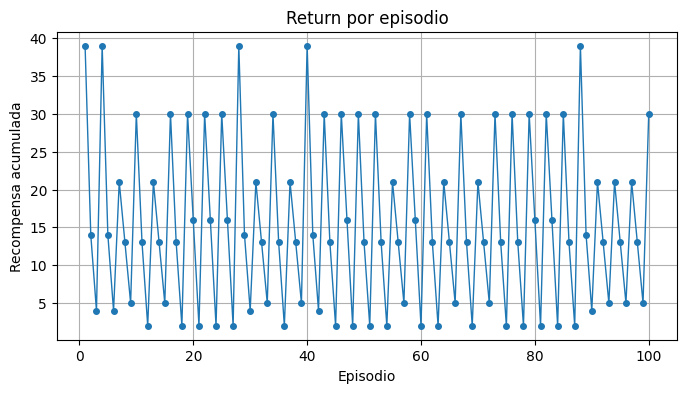

In [72]:
plt.figure(figsize=(8,4))
plt.plot(  range(1, len(returns) + 1),  returns, marker="o", linestyle="-",linewidth=1, markersize=4)
plt.title("Return por episodio")
plt.xlabel("Episodio")
plt.ylabel("Recompensa acumulada")
plt.grid(True)
plt.show()

### Visualizar el mejor modelo

In [61]:
play_env = make_atari_env(ENV_ID, n_envs=1,seed=best_seed, env_kwargs={"render_mode": "human"})
play_env = VecFrameStack(play_env, n_stack=4)

obs = play_env.reset()
done = False
total_reward = 0.0
while not done:
    action, _ = model.predict(obs, deterministic=True)
    obs, reward, done, _ = play_env.step(action)
    total_reward += float(reward[0])
    play_env.render()
    time.sleep(0.02)

print("Episodio terminado, recompensa acumulada:", total_reward)
play_env.close()

Episodio terminado, recompensa acumulada: 39.0


# Policy Gradient methods (PPO)

In [ ]:
train_env = make_atari_env(ENV_ID, seed=SEED, n_envs=N_ENVS)
train_env = VecFrameStack(train_env, n_stack=4)

eval_env = make_atari_env(ENV_ID, seed=123, n_envs=N_ENVS)
eval_env = VecFrameStack(eval_env, n_stack=4)

eval_cb = EvalCallback(eval_env, best_model_save_path="../models/ppo",
                       eval_freq=100_000, n_eval_episodes=10,
                       deterministic=True, render=False)

ckpt_cb = CheckpointCallback(save_freq=1_000_000, save_path="../models/ppo/checkpoints",
                             name_prefix="ppo_pacman")

In [ ]:
model = PPO(
    policy="CnnPolicy",
    env=train_env,
    n_steps=1024,             
    batch_size=256,
    n_epochs=4,
    gamma=0.99,
    gae_lambda=0.95,
    learning_rate=2.5e-4, 
    ent_coef=0.01,
    clip_range=0.1,
    vf_coef=0.5,
    max_grad_norm=0.5,
    verbose=1,
    device="auto"
)

Using cuda device
Wrapping the env in a VecTransposeImage.


In [ ]:
total_timesteps = 5_000_000
model.learn(total_timesteps=total_timesteps, callback=[eval_cb, ckpt_cb])
model.save("../models/ppo/best_model_final.zip")
train_env.close()

c:\Users\Usuario\miniconda3\envs\rf_lab\Lib\site-packages\stable_baselines3\common\callbacks.py:418: UserWarning: Training and eval env are not of the same type<stable_baselines3.common.vec_env.vec_transpose.VecTransposeImage object at 0x000001D507D11730> != <stable_baselines3.common.vec_env.vec_frame_stack.VecFrameStack object at 0x000001D507C45A60>
  warnings.warn("Training and eval env are not of the same type" f"{self.training_env} != {self.eval_env}")


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 1.86e+03 |
|    ep_rew_mean     | 164      |
| time/              |          |
|    fps             | 812      |
|    iterations      | 1        |
|    time_elapsed    | 1        |
|    total_timesteps | 1024     |
---------------------------------
-------------------------------------------
| rollout/                |               |
|    ep_len_mean          | 1.82e+03      |
|    ep_rew_mean          | 186           |
| time/                   |               |
|    fps                  | 695           |
|    iterations           | 2             |
|    time_elapsed         | 2             |
|    total_timesteps      | 2048          |
| train/                  |               |
|    approx_kl            | 5.5879354e-09 |
|    clip_fraction        | 0             |
|    clip_range           | 2.05e-05      |
|    entropy_loss         | -2.2          |
|    explained_variance   | -0.0246       |


## Medir performance del modelo con evaluate policy

In [79]:
model = PPO.load("../models/ppo/best_model_final.zip")
mean, std = evaluate_policy(model, eval_env, n_eval_episodes=10)
print(f"Return medio: {mean:.0f} ± {std:.0f}")

Return medio: 1111 ± 128


## ver ejecuccion

### Buscar mejor el mejor modelo en N episodios

In [80]:
best_return   = -np.inf
best_actions  = []
best_seed     = None
returns       = []

for ep in range(N_EPISODES):
    eval_env.seed(SEED + ep)
    obs = eval_env.reset()
    done = False
    ep_return = 0.0
    actions   = []

    while not done:
        action, _ = model.predict(obs, deterministic=True)
        obs, reward, done, _ = eval_env.step(action)
        actions.append(int(action))
        ep_return += float(reward[0])

    returns.append(ep_return)
    print(f"Episodio={ep} con reward={ep_return}")
    
    if ep_return > best_return:
        best_return  = ep_return
        best_actions = actions
        best_seed    = SEED + ep
        

print(f"\nMejor retorno encontrado: {best_return:.0f} (episodio seed={best_seed})")
eval_env.close()

C:\Users\Usuario\AppData\Local\Temp\ipykernel_10376\3086084644.py:16: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  actions.append(int(action))


Episodio=0 con reward=84.0
Episodio=1 con reward=12.0
Episodio=2 con reward=1.0
Episodio=3 con reward=84.0
Episodio=4 con reward=12.0
Episodio=5 con reward=1.0
Episodio=6 con reward=78.0
Episodio=7 con reward=12.0
Episodio=8 con reward=1.0
Episodio=9 con reward=84.0
Episodio=10 con reward=12.0
Episodio=11 con reward=11.0
Episodio=12 con reward=78.0
Episodio=13 con reward=12.0
Episodio=14 con reward=1.0
Episodio=15 con reward=84.0
Episodio=16 con reward=12.0
Episodio=17 con reward=11.0
Episodio=18 con reward=84.0
Episodio=19 con reward=12.0
Episodio=20 con reward=11.0
Episodio=21 con reward=84.0
Episodio=22 con reward=12.0
Episodio=23 con reward=11.0
Episodio=24 con reward=84.0
Episodio=25 con reward=12.0
Episodio=26 con reward=11.0
Episodio=27 con reward=84.0
Episodio=28 con reward=12.0
Episodio=29 con reward=1.0
Episodio=30 con reward=78.0
Episodio=31 con reward=12.0
Episodio=32 con reward=1.0
Episodio=33 con reward=84.0
Episodio=34 con reward=12.0
Episodio=35 con reward=11.0
Episodio

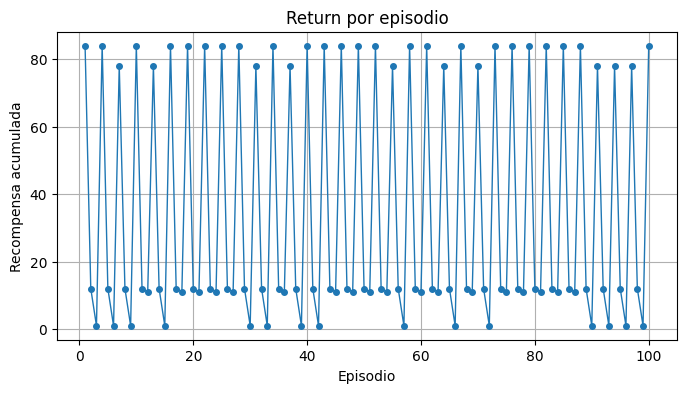

In [81]:
plt.figure(figsize=(8,4))
plt.plot(  range(1, len(returns) + 1),  returns, marker="o", linestyle="-",linewidth=1, markersize=4)
plt.title("Return por episodio")
plt.xlabel("Episodio")
plt.ylabel("Recompensa acumulada")
plt.grid(True)
plt.show()

### Visualizar el mejor modelo

In [ ]:
play_env = make_atari_env(ENV_ID, n_envs=1,seed=best_seed, env_kwargs={"render_mode": "human"})
play_env = VecFrameStack(play_env, n_stack=4)

obs = play_env.reset()
done = False
total_reward = 0.0
while not done:
    action, _ = model.predict(obs, deterministic=True)
    obs, reward, done, _ = play_env.step(action)
    total_reward += float(reward[0])
    play_env.render()
    time.sleep(0.02)

print("Episodio terminado, recompensa acumulada:", total_reward)
play_env.close()

Episodio terminado, recompensa acumulada: 84.0


# Advantage Actor-Critic (A3C)

In [ ]:
env =make_atari_env(
    ENV_ID,
    n_envs=N_ENVS,
    seed=SEED, 
    monitor_dir="../logs/logs_a3c/")

# Aplicar frame-stacking de 4 últimas imágenes (como en DQN de Atari)
env = VecFrameStack(env, n_stack=4)